In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import plotly.express as px
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)


In [2]:
df = pd.read_csv('IndianWeatherRepository.csv')

### Wind vs gust 
Gust is a sudden, brief increase in speed of the wind.

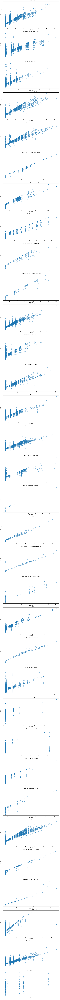

In [3]:
regions = df['region'].unique()

# Create subplots for each region
fig, axes = plt.subplots(nrows=len(regions), figsize=(12, 6 * len(regions)))

for i, region in enumerate(regions):
    region_data = df[df['region'] == region]
    
    # Create scatter plot for temperature against humidity for each region
    axes[i].scatter(region_data['wind_kph'], region_data['gust_kph'], alpha=0.5)
    
    axes[i].set_title(f'wind_kph vs. gust_kph - {region}')
    axes[i].set_xlabel('wind (kph)')
    axes[i].set_ylabel('gust (kph)')

plt.tight_layout()
plt.show()

### Wind Speed Variations Over Time

In [4]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

regions = df['region'].unique()

# Create subplots for each region
fig = make_subplots(rows=len(regions), cols=1, subplot_titles=[f'Wind Speed Variations Over Time - {region}' for region in regions])

# Loop through each region and add a line trace for wind speed against last_updated
for i, region in enumerate(regions):
    region_data = df[df['region'] == region]
    fig.add_trace(go.Scatter(x=region_data['last_updated'], y=region_data['wind_kph'],
                             mode='lines', name=region,showlegend=False, line=dict(width=2)),
                  row=i+1, col=1)

# Update layout
fig.update_layout(height=600 * len(regions), width=1000, showlegend=True, xaxis=dict(title='Time'),
                  yaxis=dict(title='Wind Speed (kph)'))



## 3. Precipitation


### Average Precipitation (mm) by Region

In [5]:
mean_wind_speed_by_region = df.groupby('region')['precip_mm'].mean().reset_index()
sorted_mean_wind_speed = mean_wind_speed_by_region.sort_values(by='precip_mm', ascending=False)

fig = px.bar(sorted_mean_wind_speed,
             x='region',
             y='precip_mm',
             title='Average Precipitation (mm) by Region',
             labels={'precip_mm': 'Precipitation(mm)', 'region': 'Region'})

fig.update_layout(xaxis=dict(tickangle=45))
fig.show()


## 4. Air Quality

In [6]:
df[['air_quality_Carbon_Monoxide',
       'air_quality_Ozone', 'air_quality_Nitrogen_dioxide',
       'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10']]

,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10
0,243.7,45.8,1.7,3.1,12.6,18.5
1,240.3,38.3,2.1,2.6,10.7,14.2
2,220.3,57.2,0.6,1.7,16.8,20.7
3,200.3,25.0,1.2,1.1,4.9,6.6
4,257.0,30.8,2.2,1.8,11.4,14.8
...,...,...,...,...,...,...
78292,2029.4,12.3,42.2,10.3,372.2,446.8
78293,427.3,8.1,5.8,1.1,51.5,57.2
78294,567.4,21.1,15.6,1.8,35.0,49.8
78295,440.6,63.7,6.9,1.9,35.9,47.9


### Average Air Quality - Carbon Monoxide(ppm) by Region

In [7]:
AVG_AQ_CM_by_region = df.groupby('region')['air_quality_Carbon_Monoxide'].mean().reset_index()
sorted_mean_AQ_CM = AVG_AQ_CM_by_region.sort_values(by='air_quality_Carbon_Monoxide', ascending=False)

fig = px.bar(sorted_mean_AQ_CM,
             x='region',
             y='air_quality_Carbon_Monoxide',
             title='Average Air Quality - Carbon Monoxide(ppm) by Region',
             labels={'air_quality_Carbon_Monoxide': 'Carbon Monoxide(ppm)', 'region': 'Region'})

fig.update_layout(xaxis=dict(tickangle=45))
fig.add_annotation(x=30,y=2500,text='Units: Parts Per Million (PPM)',showarrow=False,font=dict(size=12, color='black'))
fig.show()

### Average Air Quality - Ozone(pphm) by Region

In [8]:
AVG_AQ_Ozone_by_region = df.groupby('region')['air_quality_Ozone'].mean().reset_index()
sorted_mean_AQ_Ozone = AVG_AQ_Ozone_by_region.sort_values(by='air_quality_Ozone', ascending=False)

fig = px.bar(sorted_mean_AQ_Ozone,
             x='region',
             y='air_quality_Ozone',
             title='Average Air Quality - Ozone(pphm) by Region',
             labels={'air_quality_Ozone': 'Ozone)pphm)', 'region': 'Region'})

fig.update_layout(xaxis=dict(tickangle=45))

fig.add_annotation(x=28,y=70,text='Units: Parts Per Hundred Million (PPHM)',showarrow=False,font=dict(size=12, color='black'))
fig.show()


### Average Air Quality - Nitogen Dioxide(pphm) by Region

In [9]:
AVG_AQ_ND_by_region = df.groupby('region')['air_quality_Nitrogen_dioxide'].mean().reset_index()
sorted_mean_AQ_ND = AVG_AQ_ND_by_region.sort_values(by='air_quality_Nitrogen_dioxide', ascending=False)

fig = px.bar(sorted_mean_AQ_ND,
             x='region',
             y='air_quality_Nitrogen_dioxide',
             title='Average Air Quality - Nitrogen Dioxide(pphm) by Region',
             labels={'air_quality_Nitrogen_dioxide': 'Nitrogen Dioxide(pphm)', 'region': 'Region'})

fig.update_layout(xaxis=dict(tickangle=45))
fig.add_annotation(x=28,y=50,text='Units: Parts Per Hundred Million (PPHM)',showarrow=False,font=dict(size=12, color='black'))
fig.show()


### Average Air Quality - Sulphur Dioxide(pphm) by Region

In [10]:
AVG_AQ_SD_by_region = df.groupby('region')['air_quality_Sulphur_dioxide'].mean().reset_index()
sorted_mean_AQ_SD = AVG_AQ_SD_by_region.sort_values(by='air_quality_Sulphur_dioxide', ascending=False)

fig = px.bar(sorted_mean_AQ_SD,
             x='region',
             y='air_quality_Sulphur_dioxide',
             title='Average Air Quality - Sulphur Dioxide(pphm) by Region',
             labels={'air_quality_Sulphur_dioxide': 'Sulpher Dioxide(pphm)', 'region': 'Region'})

fig.update_layout(xaxis=dict(tickangle=45))
fig.add_annotation(x=28,y=30,text='Units: Parts Per Hundred Million (PPHM)',showarrow=False,font=dict(size=12, color='black'))

fig.show()


The visualizations reveal that **Delhi** stands out as a region of significant concern regarding air quality parameters. Across all four metrics — Carbon Monoxide (CO), Nitrogen Dioxide (NO2), Sulphur Dioxide (SO2), and Ozone — the city consistently exhibits the defile values.

In [11]:
delhi_data = df[df['region'] == 'Delhi']

fig = px.line(delhi_data, x='last_updated', y=[ 'air_quality_Ozone', 'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide'],
              labels={'value': 'Air Quality'},
              title='Air Quality Parameters Over Time - Delhi',
              line_dash_sequence=['solid', 'dash', 'dot', 'dashdot'])
fig.show()

fig = px.line(delhi_data, x='last_updated', y=[ 'air_quality_Carbon_Monoxide'],
              labels={'value': 'Air Quality'},
              title='Air Quality Carbon Monoxide Over Time - Delhi',
              line_dash_sequence=['solid', 'dash', 'dot', 'dashdot'])

fig.update_layout(xaxis_title='Time',
                  yaxis_title='Air Quality',
                  legend_title='Parameters',
                  legend=dict(x=0, y=1, traceorder='normal'),
                  margin=dict(l=0, r=0, t=40, b=0))

fig.show()
